In [59]:
#Reading .user data
filelist <- list.files(path = "../data/data1_May16/", pattern = "*335-3.new.user", full.names = TRUE)
#Reading New data
filelist1 <- list.files(path = "../data/data1_May16/", pattern = "*335-3.new$", full.names = TRUE)

UserFile = do.call(rbind, lapply(filelist, function(x) read.csv(file = x,sep=";",na.strings="(not set)")))
UserFile[,7] <- as.Date(UserFile[,7],"%Y%m%d")
UserFile[,8] <- as.integer(UserFile[,8])
UserFile[,9] <- as.integer(UserFile[,9])
UserFile[,10] <- as.numeric(UserFile[,10])
UserFile <- UserFile[order(UserFile[,7]),]

NewData <- do.call(rbind, lapply(filelist1, function(x) read.csv(file = x,sep=";")))
NewData[,3] <- as.Date(as.character(NewData[,3]),"%Y%m%d")
NewData <- NewData[order(NewData[,3]),]

total = merge(NewData,UserFile,all=T)
total = total[complete.cases(total),]
total$ga.deviceCategory <- factor(total$ga.deviceCategory)
total$ga.mobileDeviceBranding <- factor(total$ga.mobileDeviceBranding)   
total$ga.mobileDeviceInfo <- factor(total$ga.mobileDeviceInfo)  
total$ga.fatalExceptions <- NULL
total$ga.timeOnSite  <- NULL
total <- total[order(total[,3]),]

In [6]:
cor(total[sapply(total, is.numeric)], method="spearman")

,ga.exceptions,ga.newVisits,ga.visits,ga.newUsers,ga.users,ga.sessionsPerUser
ga.exceptions,1.000000000,0.063692512,0.025232506,0.049733747,0.006466870,0.003341282
ga.newVisits,0.06369251,1.00000000,0.39489412,0.81922784,-0.02803634,0.07313382
ga.visits,0.025232506,0.394894117,1.000000000,0.282150783,0.007521039,0.409860691
ga.newUsers,0.04973375,0.81922784,0.28215078,1.00000000,-0.04804267,0.11357214
ga.users,0.006466870,-0.028036337,0.007521039,-0.048042672,1.000000000,0.036916693
ga.sessionsPerUser,0.003341282,0.073133821,0.409860691,0.113572137,0.036916693,1.000000000


In [7]:
head(total)

,ga.appVersion,ga.operatingSystemVersion,ga.date,ga.exceptions,ga.newVisits,ga.visits,ga.mobileDeviceBranding,ga.mobileDeviceModel,ga.mobileDeviceInfo,ga.deviceCategory,ga.newUsers,ga.users,ga.sessionsPerUser
11284,6.2.5,7.0.4,2014-01-27,0,29,58,Apple,iPhone,Apple iPhone,mobile,7,71,242
10635,6.2.5,6.1.3,2014-01-28,0,58,58,Apple,iPod Touch,Apple iPod Touch,mobile,7,71,2
10636,6.2.5,6.1.3,2014-01-28,0,58,58,Apple,iPad,Apple iPad,tablet,7,71,2
11285,6.2.5,7.0.4,2014-01-29,0,88,175,Apple,iPhone,Apple iPhone,mobile,13,99,242
6043,6.2.12,7.0.4,2014-01-30,0,29,58,Apple,iPhone,Apple iPhone,mobile,7,71,242
11286,6.2.5,7.0.4,2014-01-31,0,29,88,Apple,iPhone,Apple iPhone,mobile,7,71,419


In [8]:
summary(total)

 ga.appVersion  ga.operatingSystemVersion    ga.date          
 6.2.11 :4291   7.1.1  : 2537             Min.   :2014-01-27  
 6.2.9  :4207   7.1.2  : 2527             1st Qu.:2014-12-23  
 6.2.5  :3493   8.3    : 1603             Median :2015-07-03  
 6.2.7  :3161   7.1    : 1553             Mean   :2015-06-13  
 6.2.12 :2897   8.4    : 1193             3rd Qu.:2015-12-17  
 6.2.10 :1585   7.0.4  : 1165             Max.   :2016-05-23  
 (Other):2172   (Other):11228                                 
 ga.exceptions       ga.newVisits       ga.visits     ga.mobileDeviceBranding
 Min.   : 0.00000   Min.   :  0.000   Min.   :   29   Apple:21806            
 1st Qu.: 0.00000   1st Qu.:  0.000   1st Qu.:  117                          
 Median : 0.00000   Median :  0.000   Median :  263                          
 Mean   : 0.02527   Mean   :  6.256   Mean   :  965                          
 3rd Qu.: 0.00000   3rd Qu.:  0.000   3rd Qu.:  760                          
 Max.   :58.00000   Max.   :

In [60]:
unique(total$ga.appVersion)

[1] 6.2.5  6.2.12 6.2.11 6.2.14 6.2.7  6.2.8  6.2.15 6.2.16 6.2.9  6.2.10
[11] 6.2.17
12 Levels: 6.2.10 6.2.11 6.2.12 6.2.14 6.2.15 6.2.16 6.2.17 6.2.5 ... ga:appVersion

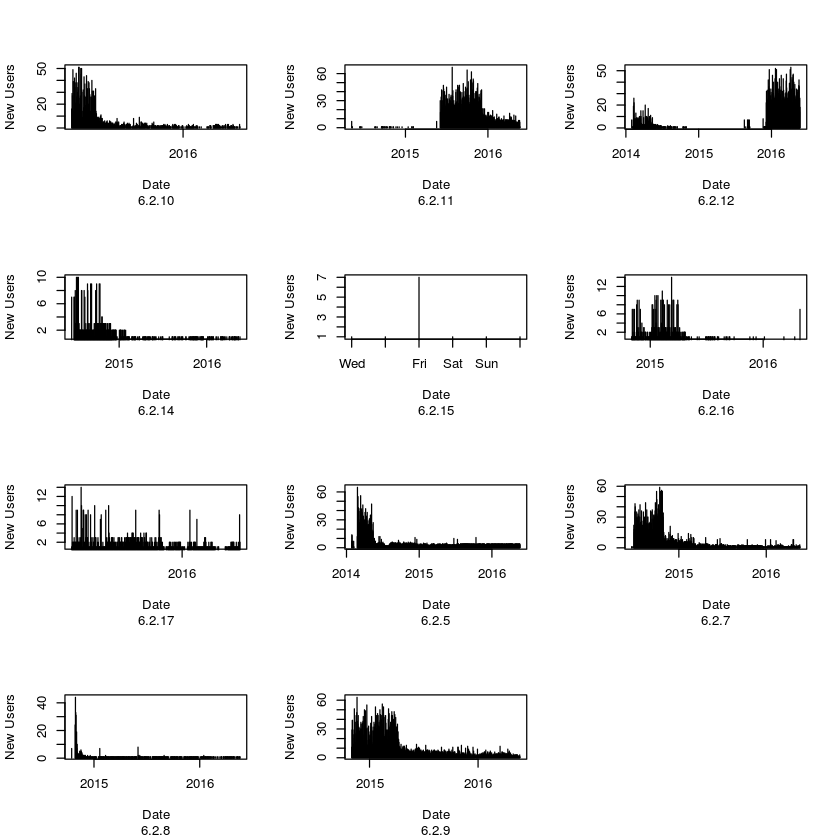

In [61]:
releases = unique(total$ga.appVersion)

par(mfrow=c(4,3))

for (r in sort(releases)){
     y= total[total$ga.appVersion == r,]
     z= aggregate.data.frame(y$ga.newUsers,by=list(unique.values= y$ga.date), FUN = sum)
     plot(z,type="h",xlab="Date",ylab="New Users",sub=r)
 }

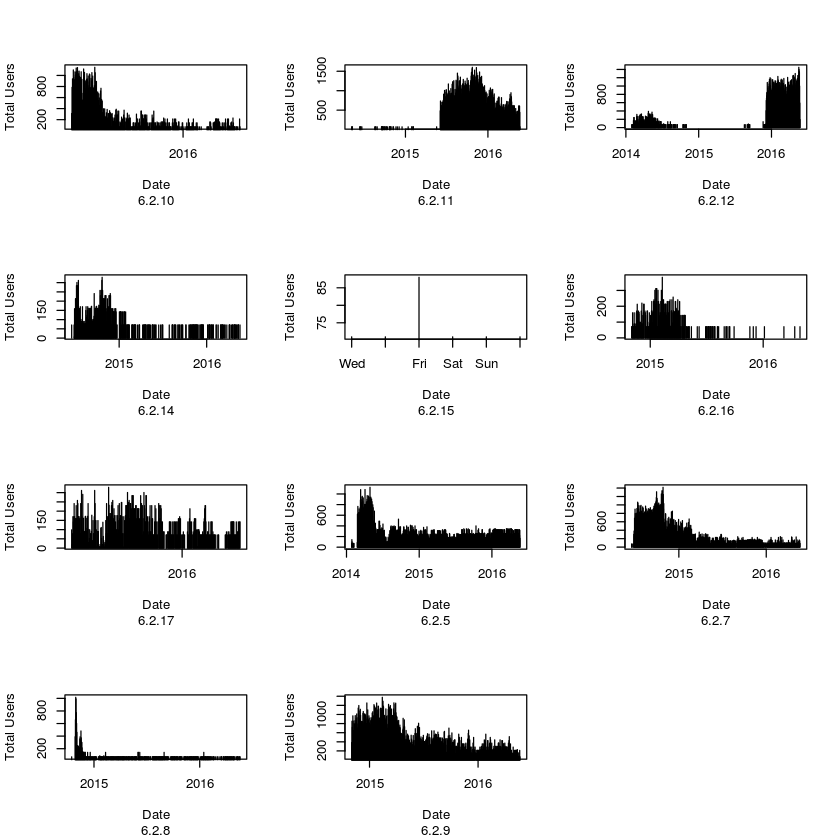

In [62]:
par(mfrow=c(4,3))

for (r in sort(releases)){
     y= total[total$ga.appVersion == r,]
     z= aggregate.data.frame(y$ga.users,by=list(unique.values= y$ga.date), FUN = sum)
     plot(z,type="h",xlab="Date",ylab="Total Users",sub=r)
 }

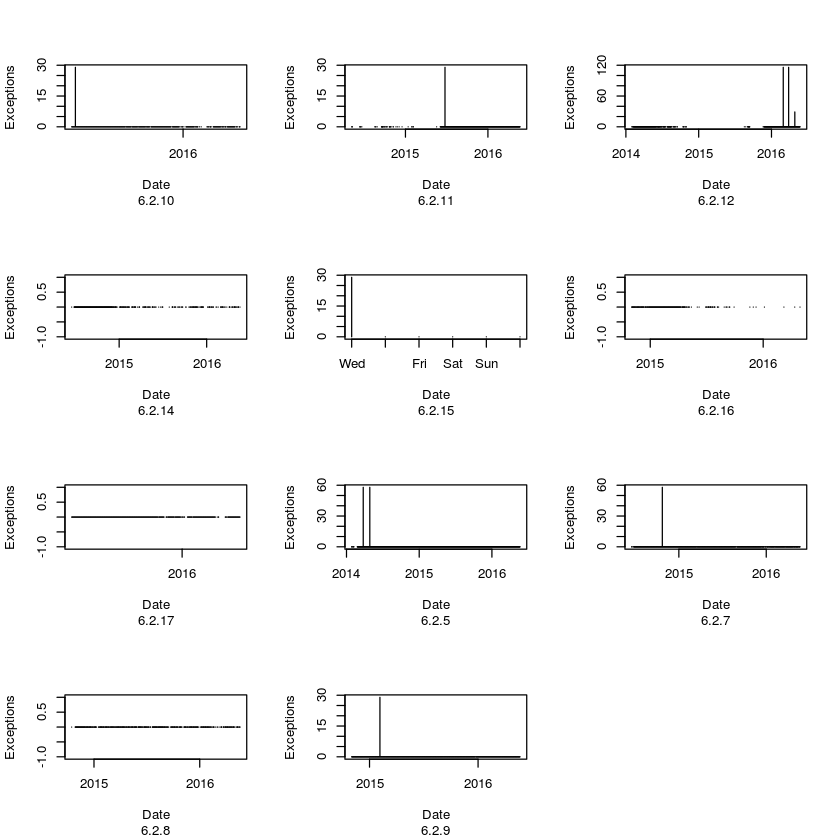

In [63]:
par(mfrow=c(4,3))

for (r in sort(releases)){
     y= total[total$ga.appVersion == r,]
     z= aggregate.data.frame(y$ga.exceptions,by=list(unique.values= y$ga.date), FUN = sum)
     plot(z,type="h",xlab="Date",ylab="Exceptions",sub=r)
 }

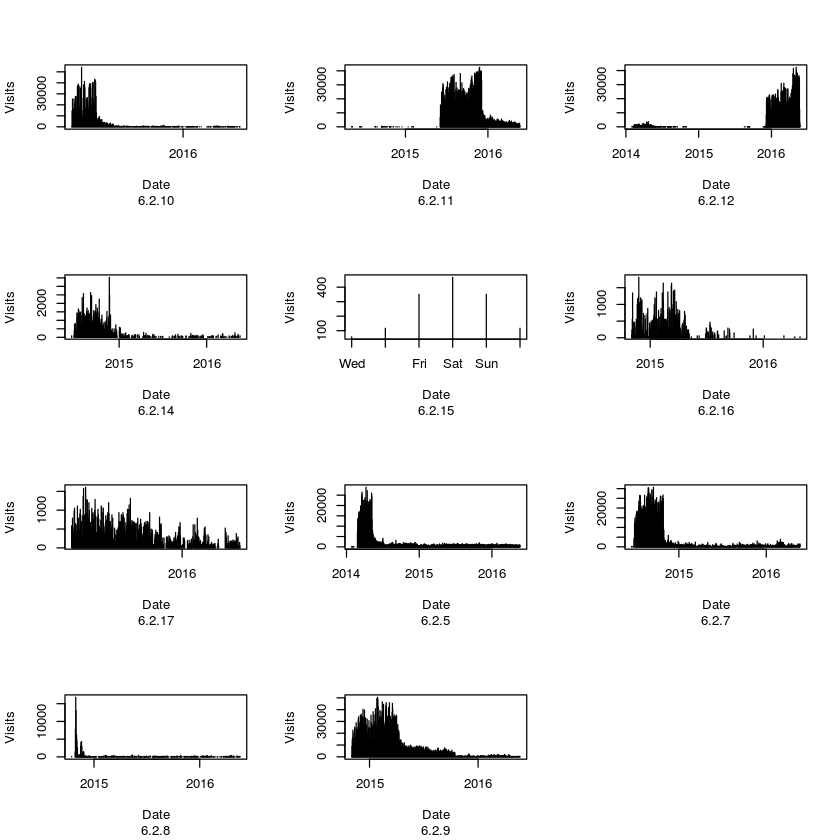

In [64]:
par(mfrow=c(4,3))

for (r in sort(releases)){
     y= total[total$ga.appVersion == r,]
     z= aggregate.data.frame(y$ga.visits,by=list(unique.values= y$ga.date), FUN = sum)
     plot(z,type="h",xlab="Date",ylab="Visits",sub=r)
 }

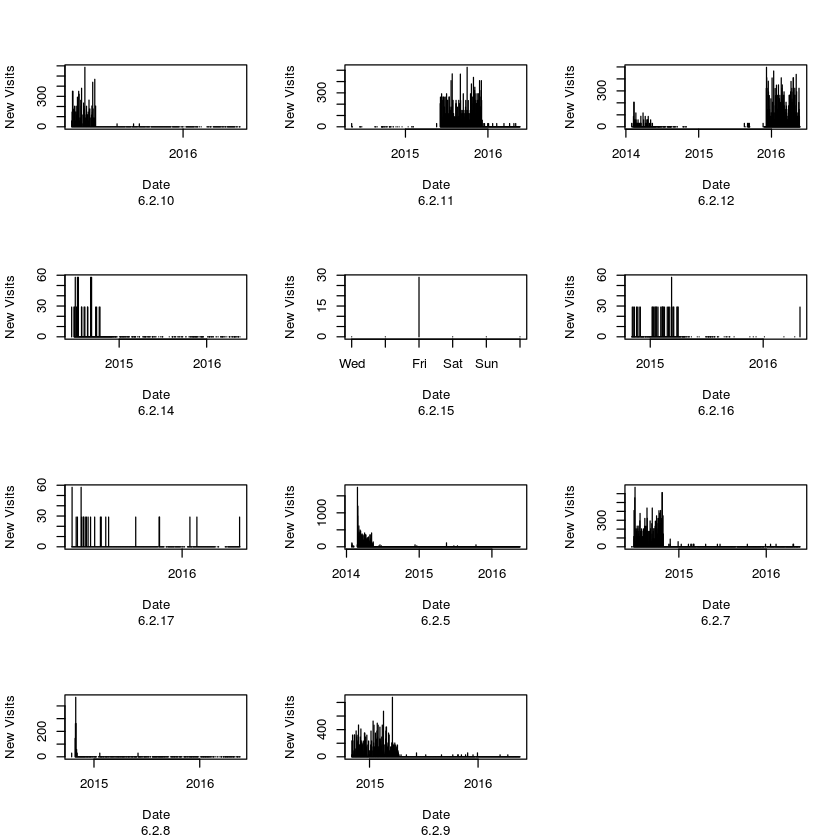

In [65]:
par(mfrow=c(4,3))

for (r in sort(releases)){
     y= total[total$ga.appVersion == r,]
     z= aggregate.data.frame(y$ga.newVisits,by=list(unique.values= y$ga.date), FUN = sum)
     plot(z,type="h",xlab="Date",ylab="New Visits",sub=r)
 }

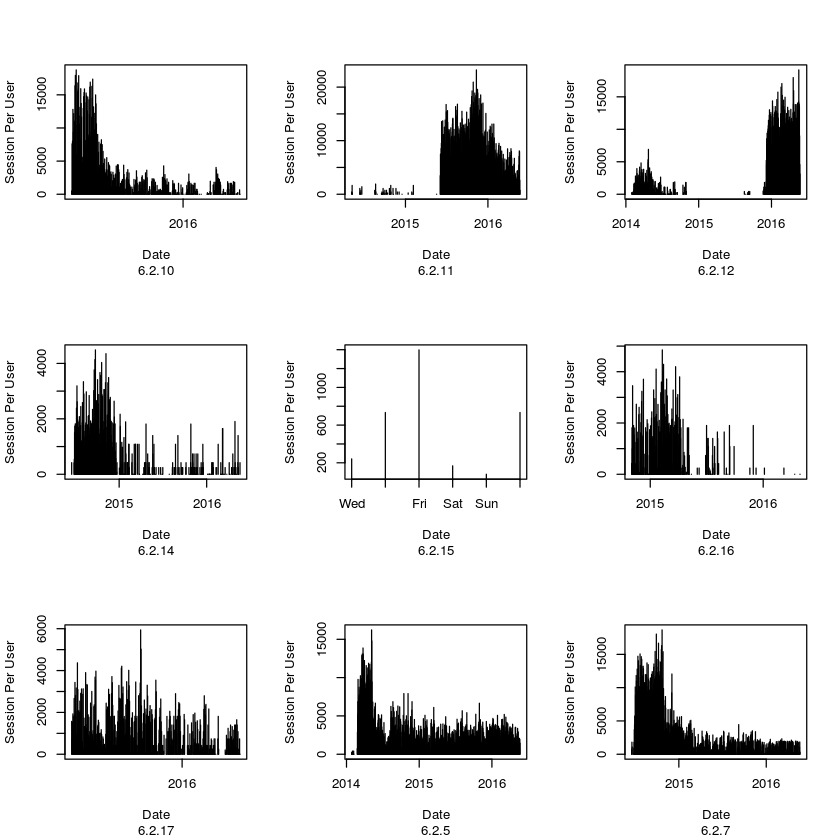

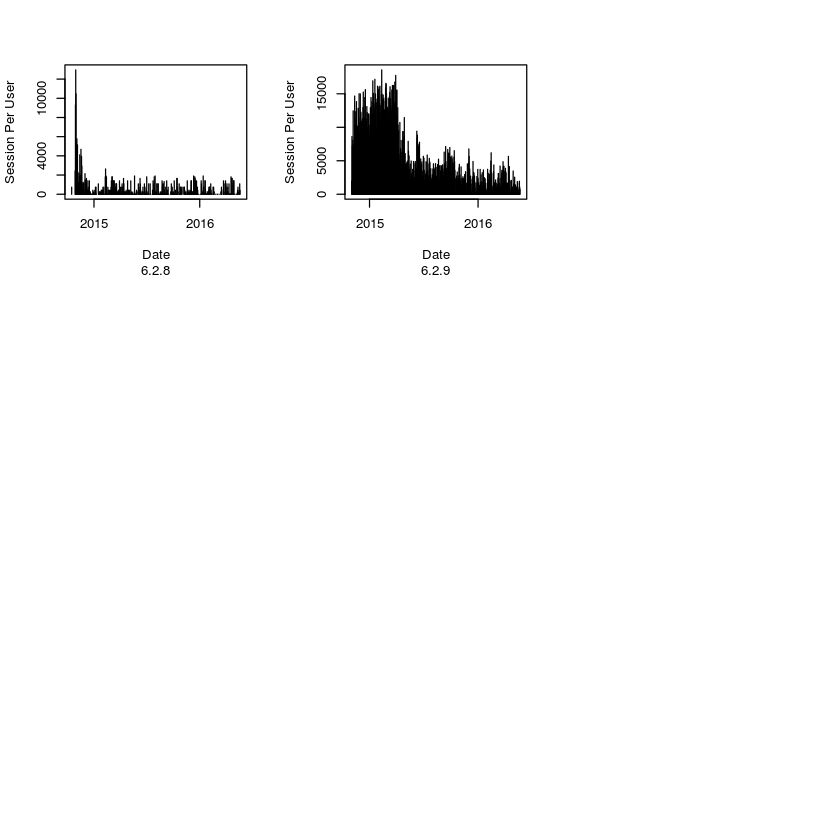

In [66]:
par(mfrow=c(3,3))

for (r in sort(releases)){
     y= total[total$ga.appVersion == r,]
     z= aggregate.data.frame(y$ga.sessionsPerUser,by=list(unique.values= y$ga.date), FUN = sum)
     plot(z,type="h",xlab="Date",ylab="Session Per User",sub=r)
 }

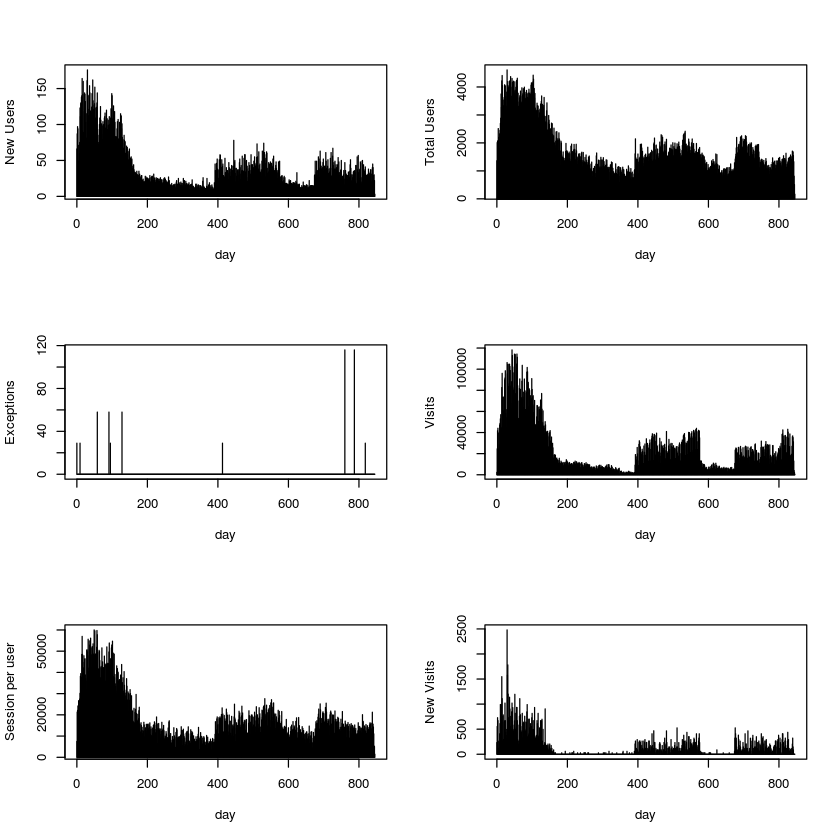

In [9]:
#collapsing all releases to get aggregate curve
releases = unique(total$ga.appVersion)
par(mfrow=c(3,2))


agg = data.frame()
for (r in sort(releases)){
  y= total[total$ga.appVersion == r,]
  z= aggregate.data.frame(y$ga.newUsers,by=list(unique.values= y$ga.date), FUN = sum)
  if(sum(z[,2]>0)){
  k = c()
  for (i in seq_along(z[,1])){k[i] = z[i,1] - z[1,1]}
  z$day = k
  z$unique.values = NULL
  agg = rbind(agg,z)}
}
agg2 = aggregate.data.frame(agg$x, by=list(day= agg$day), FUN = sum)
plot(agg2,type="h",ylab="New Users")

agg = data.frame()
for (r in sort(releases)){
  y= total[total$ga.appVersion == r,]
  z= aggregate.data.frame(y$ga.users,by=list(unique.values= y$ga.date), FUN = sum)
  if(sum(z[,2]>0)){
  k = c()
  for (i in seq_along(z[,1])){k[i] = z[i,1] - z[1,1]}
  z$day = k
  z$unique.values = NULL
  agg = rbind(agg,z)}
}
agg2 = aggregate.data.frame(agg$x, by=list(day= agg$day), FUN = sum)
plot(agg2,type="h",ylab="Total Users")

agg = data.frame()
for (r in sort(releases)){
  y= total[total$ga.appVersion == r,]
  z= aggregate.data.frame(y$ga.exceptions,by=list(unique.values= y$ga.date), FUN = sum)
  if(sum(z[,2]>0)){
  k = c()
  for (i in seq_along(z[,1])){k[i] = z[i,1] - z[1,1]}
  z$day = k
  z$unique.values = NULL
  agg = rbind(agg,z)}
}
agg2 = aggregate.data.frame(agg$x, by=list(day= agg$day), FUN = sum)
plot(agg2,type="h",ylab="Exceptions")

agg = data.frame()
for (r in sort(releases)){
  y= total[total$ga.appVersion == r,]
  z= aggregate.data.frame(y$ga.visits,by=list(unique.values= y$ga.date), FUN = sum)
  if(sum(z[,2]>0)){
  k = c()
  for (i in seq_along(z[,1])){k[i] = z[i,1] - z[1,1]}
  z$day = k
  z$unique.values = NULL
  agg = rbind(agg,z)}
}
agg2 = aggregate.data.frame(agg$x, by=list(day= agg$day), FUN = sum)
plot(agg2,type="h",ylab="Visits")

agg = data.frame()
for (r in sort(releases)){
  y= total[total$ga.appVersion == r,]
  z= aggregate.data.frame(y$ga.sessionsPerUser,by=list(unique.values= y$ga.date), FUN = sum)
  if(sum(z[,2]>0)){
  k = c()
  for (i in seq_along(z[,1])){k[i] = z[i,1] - z[1,1]}
  z$day = k
  z$unique.values = NULL
  agg = rbind(agg,z)}
}
agg2 = aggregate.data.frame(agg$x, by=list(day= agg$day), FUN = sum)
plot(agg2,type="h",ylab="Session per user")

agg = data.frame()
for (r in sort(releases)){
  y= total[total$ga.appVersion == r,]
  z= aggregate.data.frame(y$ga.newVisits,by=list(unique.values= y$ga.date), FUN = sum)
  if(sum(z[,2]>0)){
  k = c()
  for (i in seq_along(z[,1])){k[i] = z[i,1] - z[1,1]}
  z$day = k
  z$unique.values = NULL
  agg = rbind(agg,z)}
}
agg2 = aggregate.data.frame(agg$x, by=list(day= agg$day), FUN = sum)
plot(agg2,type="h",ylab="New Visits")


In [10]:
#Example by Dr. Mockus

releases = unique(total$ga.appVersion)
cvt <- function(date,fmt="%Y-%m-%d"){
  unclass(as.POSIXct(strptime(date,fmt))+0);
}
rcvt <- function(secs){
  zero <- strptime("1970/01/01","%Y/%m/%d");
  as.POSIXct(zero+secs);
}

total$ts = cvt(total$ga.date);
gad=c()
for (r in sort(releases)){
  d = sort(total$ts[total$ga.appVersion==r])[1];
  gad = c(gad, d)
}
names(gad) = sort(releases)

stats = c();
for (r in sort(releases)){
  a = total[total$ga.appVersion==r,]
  a = a[order(a$ts),];
  e = sum(a$ga.exceptions);
  v = sum(a$ga.visits);
  nu = sum(a$ga.newUsers);
  u = sum(a$ga.users);
  tt = (a$ts[dim(a)[1]] - a$ts[1])/3600/24/36.25;
  gad = a$ts[1]/3600/24/36.25+1970;
  e1 = sum(a$ga.exceptions>0);
  v1 = sum(a$ga.visits>0);
  nu1 = sum(a$ga.newUsers>0);
  u1 = sum(a$ga.users>0);
  
  stats = rbind(stats, c(e,v,nu,u,tt,e1,v1,nu1,u1,gad));
}
stats=data.frame(stats);
row.names(stats) = sort(releases);
names(stats) = c("e","v","nu","u","tt","e1","v1","nu1","u1","gad");

In [31]:
head(stats)

,e,v,nu,u,tt,e1,v1,nu1,u1,gad
6.2.10,29,1838457,2518,106839,11.25517,1,1585,1585,1585,2426.028
6.2.11,29,4912343,7112,303126,20.55172,1,4291,4291,4291,2416.841
6.2.12,261,3423316,5463,196522,23.28276,5,2897,2897,2897,2414.138
6.2.14,0,172912,666,36404,19.36552,0,546,546,546,2417.945
6.2.15,29,1462,12,443,0.137931,1,6,6,6,2421.641
6.2.16,0,96648,576,27795,15.0069,0,379,379,379,2421.752


In [56]:
#the exceptions/per new user drops 10 times with more new users
i = 6000
x = tapply(stats$e,stats$nu>i,mean)/tapply(stats$nu,stats$nu>i,mean) 
rat = (x[1]/x[2])
print (rat)
print (x)
#the exceptions/per visit drops 200+ times with more new users
x = tapply(stats$e,stats$nu>i,mean)/tapply(stats$v,stats$nu>i,mean)
rat = (x[1]/x[2])
print (rat)
print (x)

   FALSE 
5.791552 
      FALSE        TRUE 
0.023826785 0.004114059 
   FALSE 
8.473389 
       FALSE         TRUE 
4.678575e-05 5.521492e-06 


[1] 570
   FALSE 
161.0046 
[1] 570
   FALSE 
799.5266 


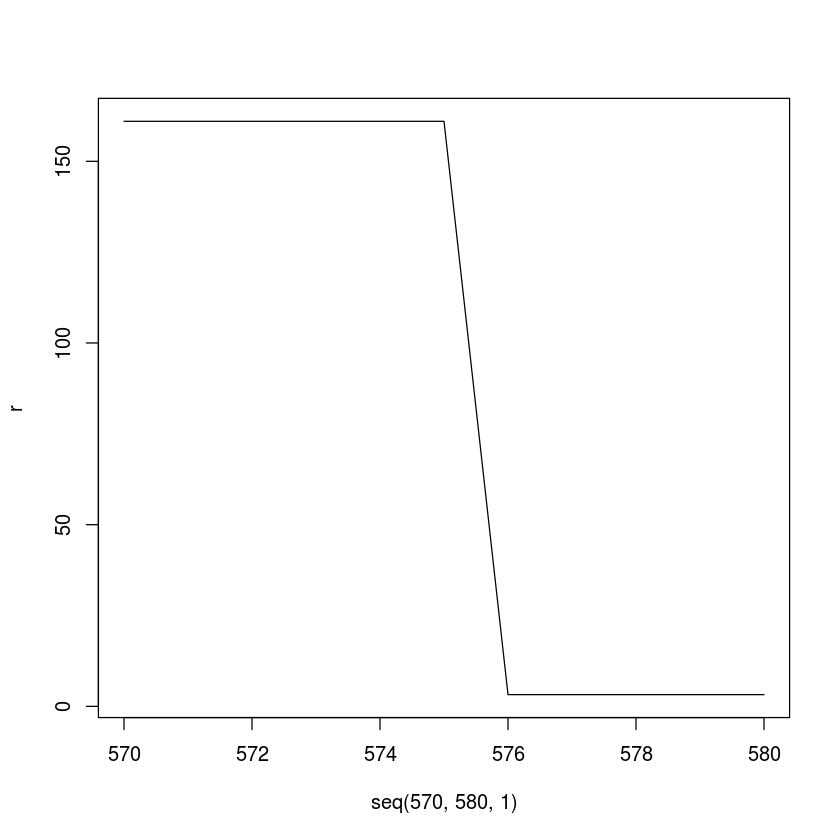

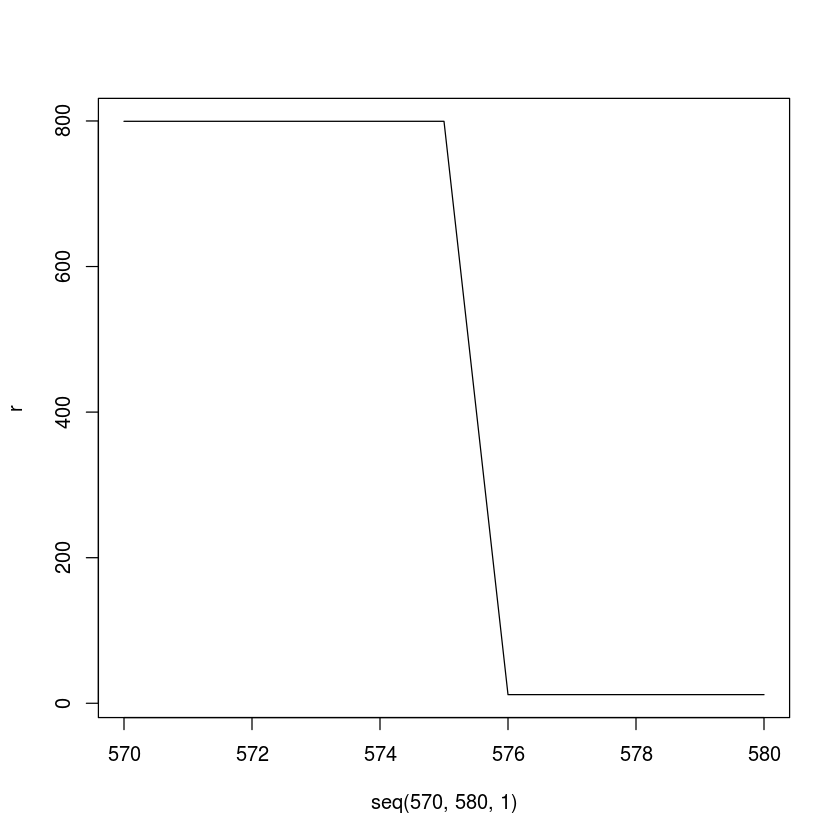

In [41]:
r =c()
old = 1
for (i in seq(570,580,1)){
    x = tapply(stats$e,stats$nu>i,mean)/tapply(stats$nu,stats$nu>i,mean)
    r = c(r,(x[1]/x[2]))
    if ((x[1]/x[2]) > old){
        piv = i
        rat = (x[1]/x[2])
        old = rat
    }
}
print (piv)
print (rat)
plot ( seq(570,580,1),r,type="l")

r =c()
old = 1
for (i in  seq(570,580,1)){
    x = tapply(stats$e,stats$nu>i,mean)/tapply(stats$v,stats$nu>i,mean)
    r = c(r,(x[1]/x[2]))
    if ((x[1]/x[2]) > old){
        piv = i
        rat = (x[1]/x[2])
        old = rat
    }
}
print (piv)
print (rat)
plot ( seq(570,580,1),r,type="l")


[1] 300
   FALSE 
161.0046 
[1] 300
   FALSE 
799.5266 


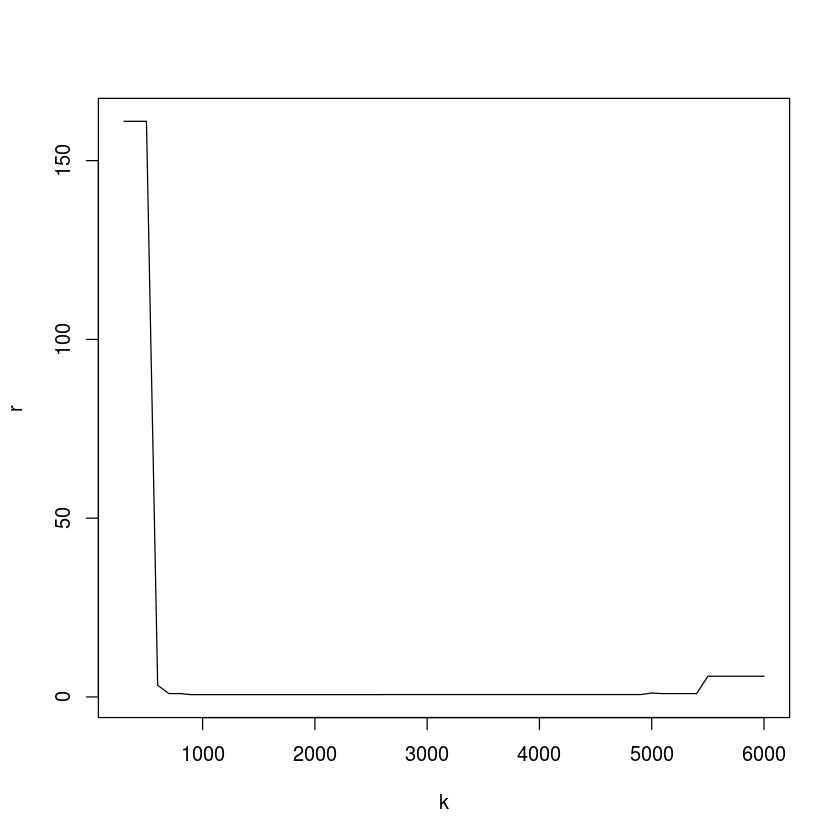

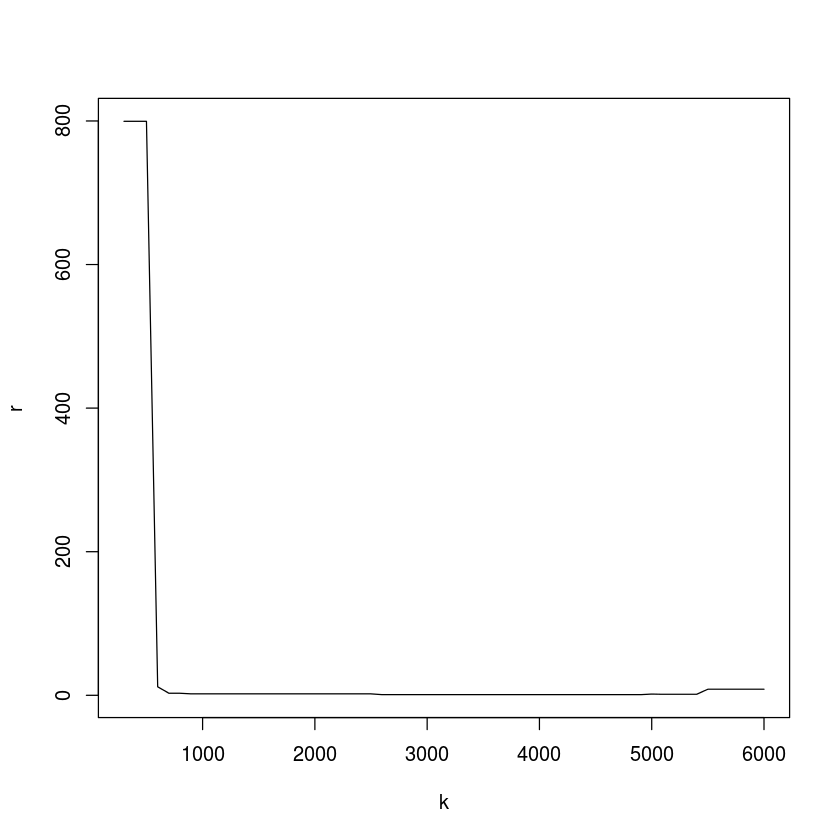

In [58]:
r =c()
k = seq(300,6000,100)

old = 1
for (i in k){
    x = tapply(stats$e,stats$nu>i,mean)/tapply(stats$nu,stats$nu>i,mean)
    r = c(r,(x[1]/x[2]))
    if ((x[1]/x[2]) > old){
        piv = i
        rat = (x[1]/x[2])
        old = rat
    }
}
print (piv)
print (rat)
plot ( k,r,type="l")

r = c()
old = 1
for (i in k){
    x = tapply(stats$e,stats$nu>i,mean)/tapply(stats$v,stats$nu>i,mean)
    r = c(r,(x[1]/x[2]))
    if ((x[1]/x[2]) > old){
        piv = i
        rat = (x[1]/x[2])
        old = rat
    }
}
print (piv)
print (rat)
plot ( k,r,type="l")

[1] 25000
   FALSE 
190.4442 
[1] 25000
   FALSE 
799.5266 


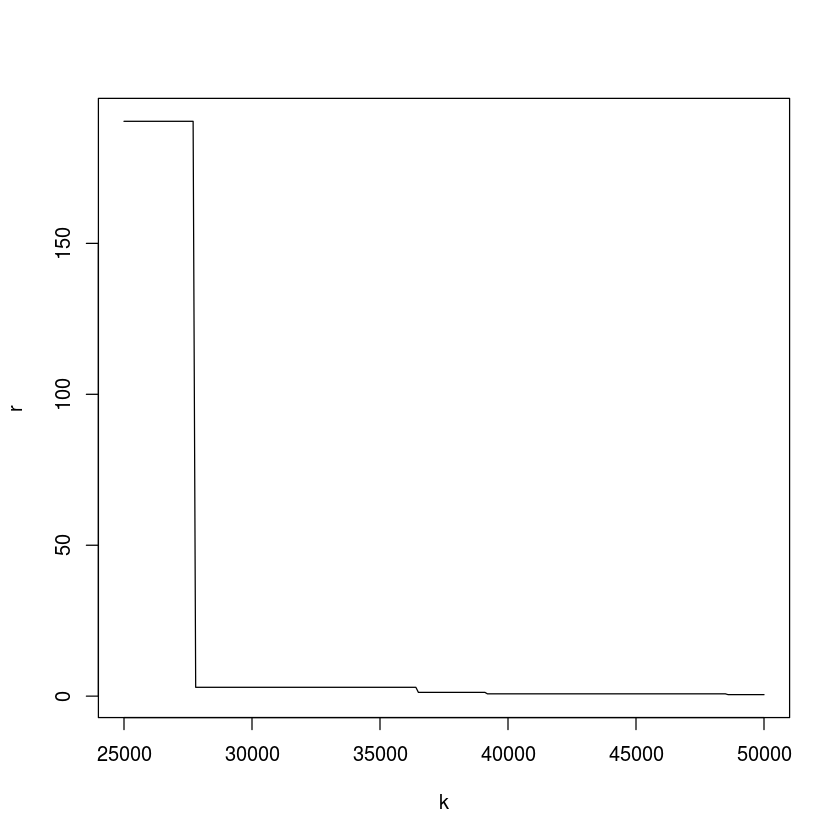

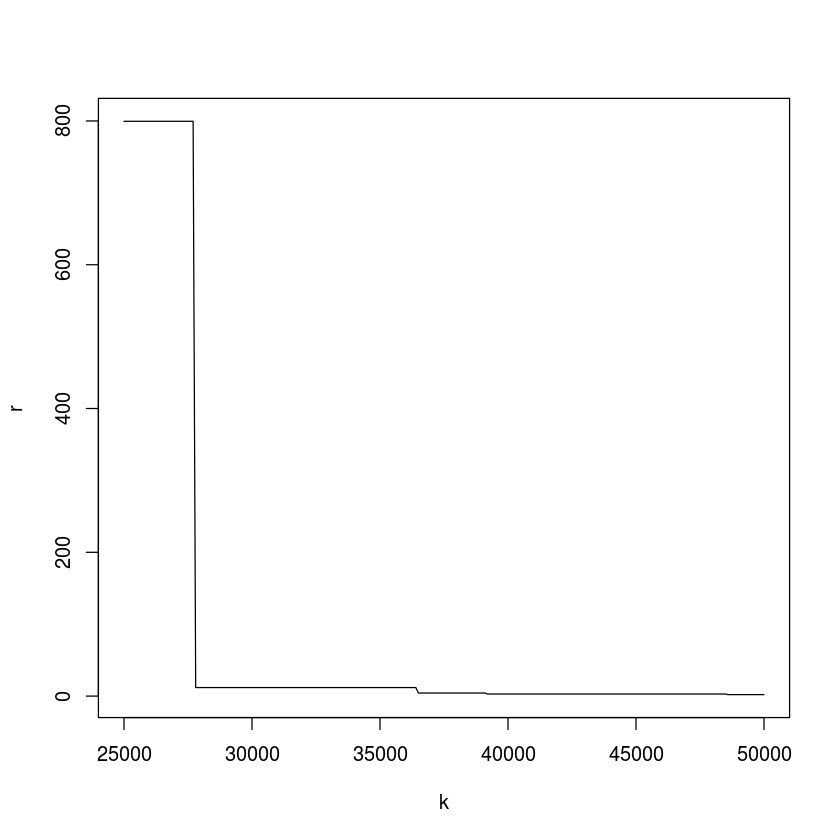

In [50]:
r =c()
k = seq(25000,50000,100)

old = 1
for (i in k){
    x = tapply(stats$e,stats$u>i,mean)/tapply(stats$u,stats$u>i,mean)
    r = c(r,(x[1]/x[2]))
    if ((x[1]/x[2]) > old){
        piv = i
        rat = (x[1]/x[2])
        old = rat
    }
}
print (piv)
print (rat)
plot ( k,r,type="l")

r = c()
old = 1
for (i in k){
    x = tapply(stats$e,stats$u>i,mean)/tapply(stats$v,stats$u>i,mean)
    r = c(r,(x[1]/x[2]))
    if ((x[1]/x[2]) > old){
        piv = i
        rat = (x[1]/x[2])
        old = rat
    }
}
print (piv)
print (rat)
plot ( k,r,type="l")